
# WEAPON DETECTION USING YOLOV10

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="VFMZoShoqHZHfuftjByi")
project = rf.workspace("nust-university").project("gdxraydataset2")
version = project.version(1)
dataset = version.download("yolov9")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.3 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to GDXrayDataSet2-1 in yolov9:: 100%|██████████| 888/888 [00:00<00:00, 7627.23it/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [ ]:
!yolo task=detect mode=train model=yolov10s.pt data={dataset.location}/data.yaml epochs=30 imgsz=640

100% 15.9M/15.9M [00:00<00:00, 78.2MB/s]
Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov10s.pt, data=/content/GDXrayDataSet2-1/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_

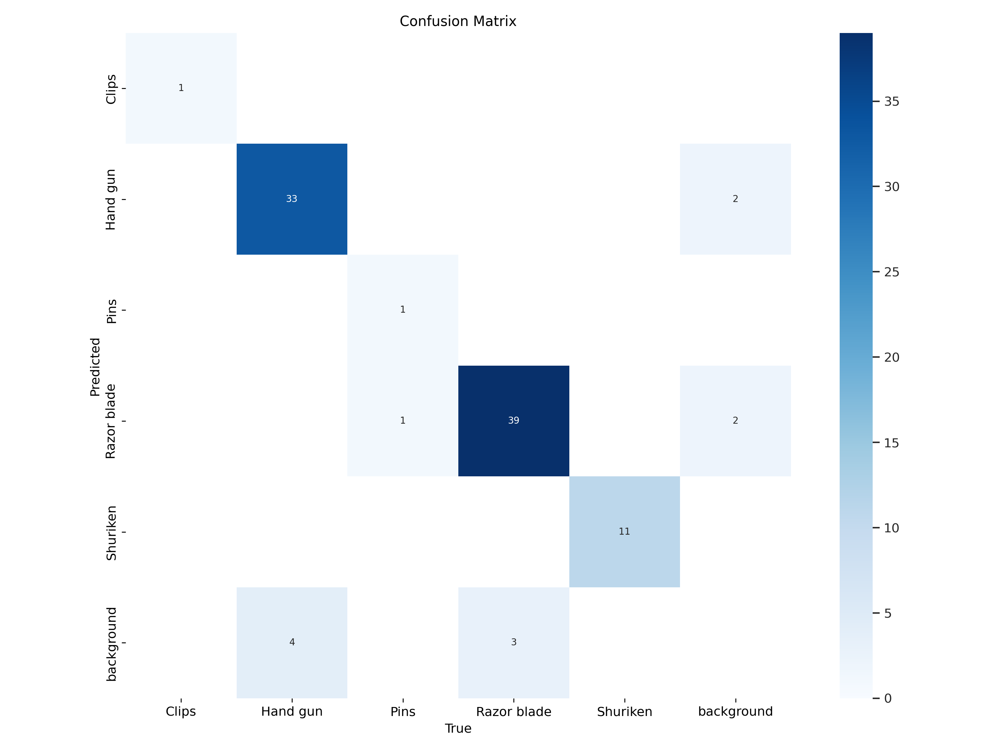

In [ ]:
import os
from IPython.display import display, Image
from IPython import display
Image(filename=f'/content/runs/detect/train/confusion_matrix.png',width=600)

In [ ]:
!yolo task=detect mode=val model=/content/drive/MyDrive/weaponFinal/best.pt data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,038,830 parameters, 0 gradients, 24.5 GFLOPs
100% 755k/755k [00:00<00:00, 21.7MB/s]
val: Scanning /content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/valid/labels.cache... 93 images, 0 backgrounds, 0 corrupt: 100% 93/93 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 6/6 [00:18<00:00,  3.01s/it]
                   all         93         93      0.972      0.882      0.985       0.76
                 Clips          1          1      0.913          1      0.995      0.796
              Hand gun         37         37      0.987      0.865      0.977      0.822
                  Pins          2          2          1       0.64      0.995      0.681
           Razor blade         42         42      0.973      0.905       0.96      0.721
              Shuriken         11         11      0.987   

In [ ]:
!yolo task=detect mode=predict model= /content/drive/MyDrive/weaponFinal/best.pt conf=0.25 source={dataset.location}/test/images

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,038,830 parameters, 0 gradients, 24.5 GFLOPs

image 1/42 /content/GDXrayDataSet2-1/test/images/108_PNG.rf.ab7ab79089766bb0887614e7e34db73b.jpg: 480x640 1 Hand gun, 87.8ms
image 2/42 /content/GDXrayDataSet2-1/test/images/112_PNG.rf.a5f873a39f4f98aa4d542f50a3ce4d2a.jpg: 480x640 2 Hand guns, 13.7ms
image 3/42 /content/GDXrayDataSet2-1/test/images/114_PNG.rf.ba7fa24ce421ae8b3411f5c140027b23.jpg: 480x640 1 Hand gun, 13.6ms
image 4/42 /content/GDXrayDataSet2-1/test/images/116_PNG.rf.8a6b715c163cb5e88c65baa2fd686e96.jpg: 480x640 1 Hand gun, 13.6ms
image 5/42 /content/GDXrayDataSet2-1/test/images/117_PNG.rf.a518ba322c420240bfa436f7c25680ea.jpg: 480x640 2 Hand guns, 13.6ms
image 6/42 /content/GDXrayDataSet2-1/test/images/150_PNG.rf.ffd8f8fc685dee1e0a138bb9ce37bc5b.jpg: 480x640 1 Hand gun, 13.6ms
image 7/42 /content/GDXrayDataSet2-1/test/images/155_PNG.rf.a803f062c9c496f

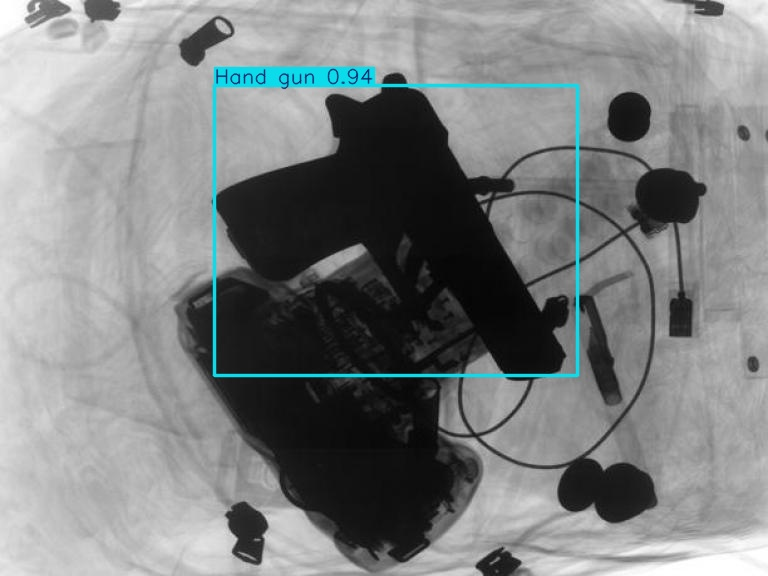

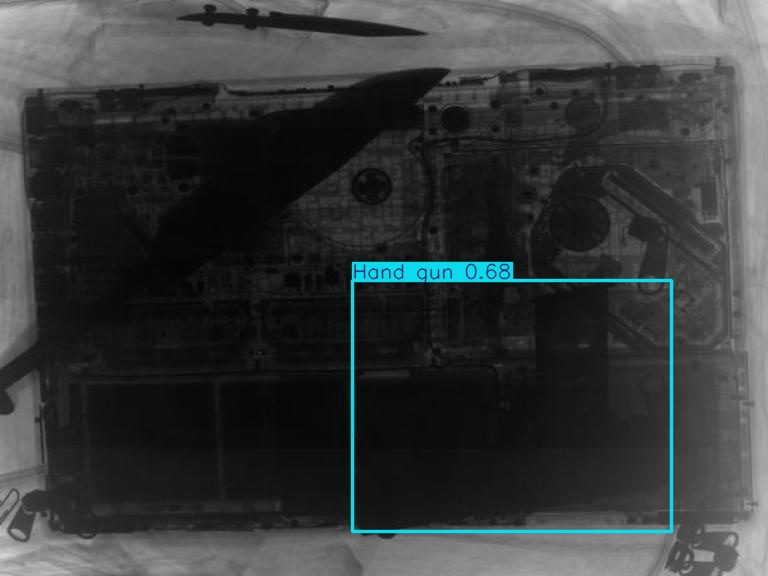

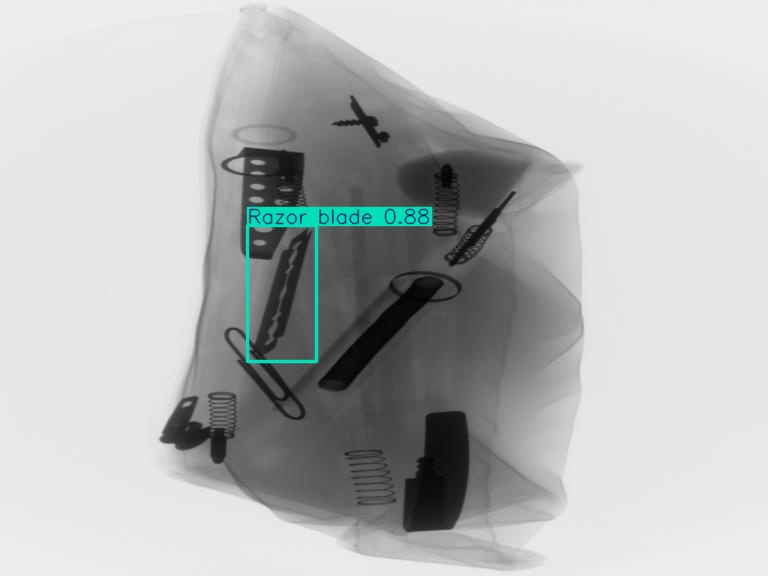

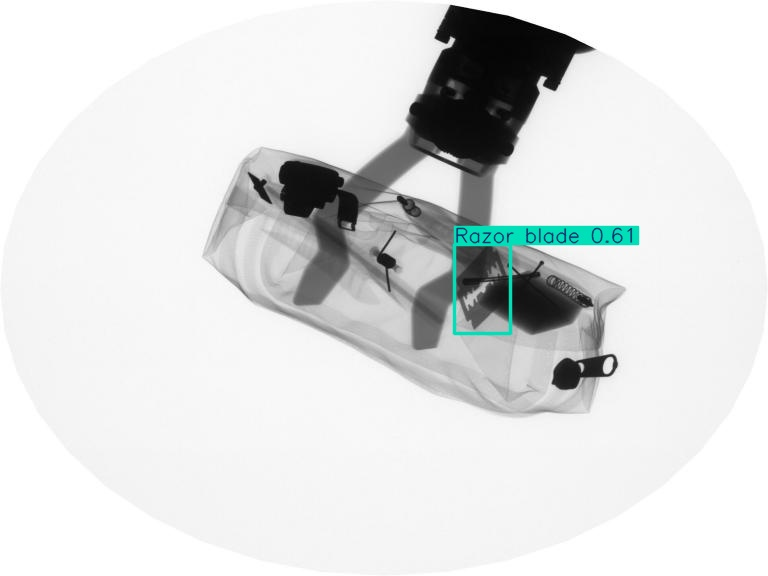

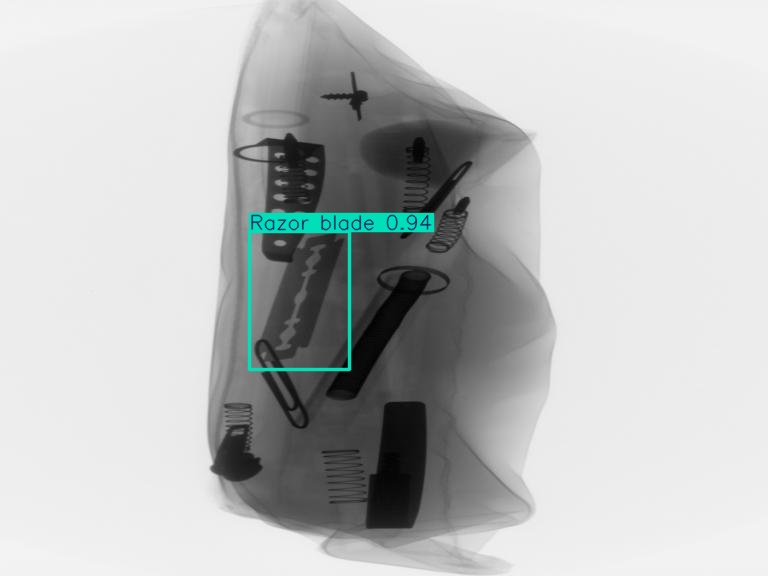

...

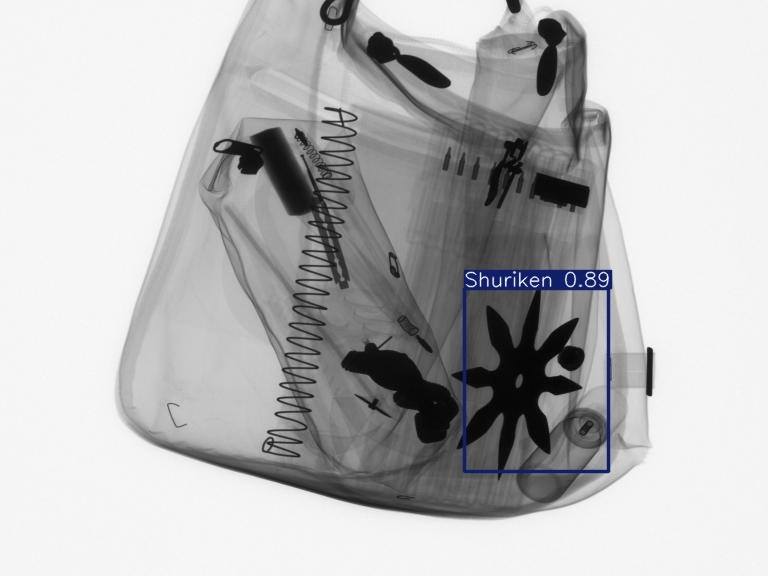

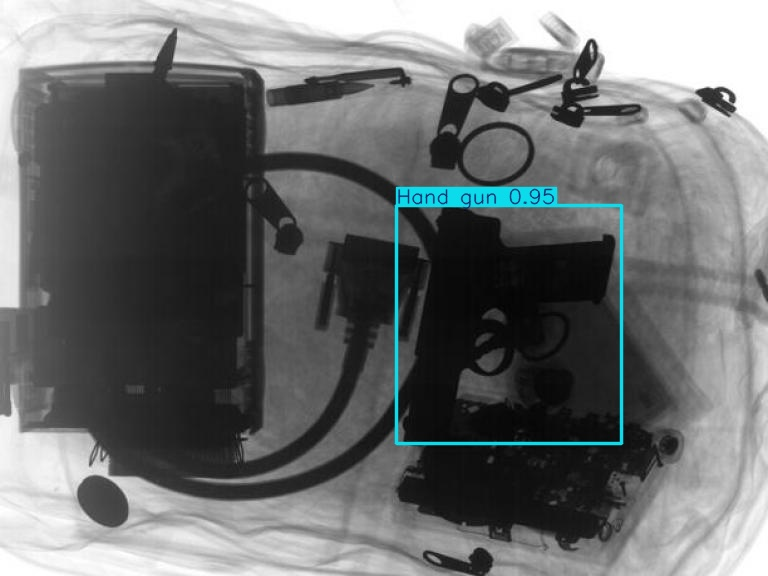

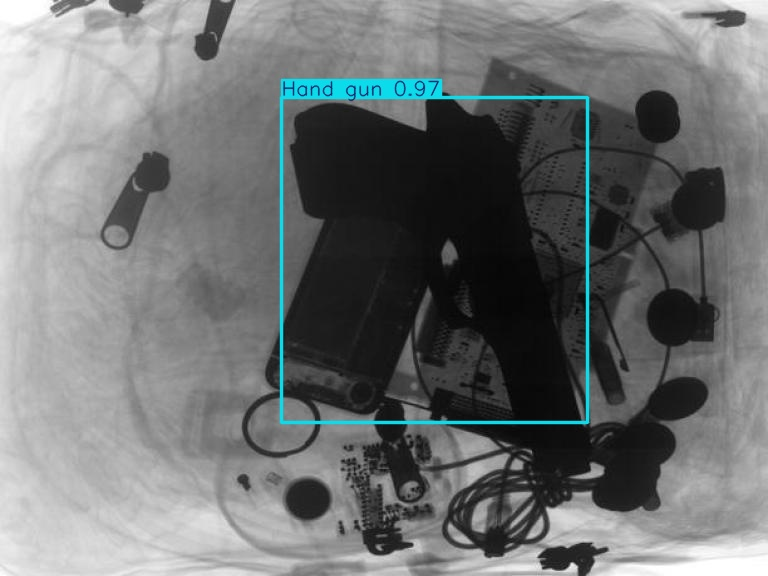

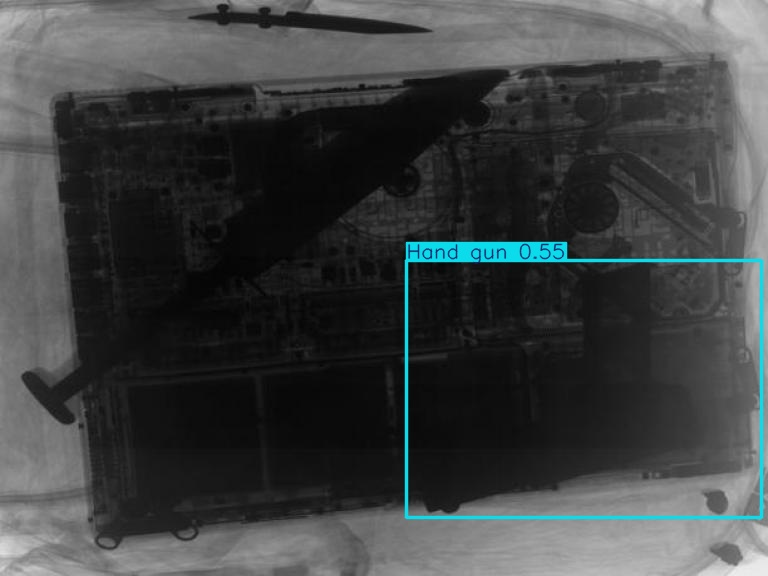

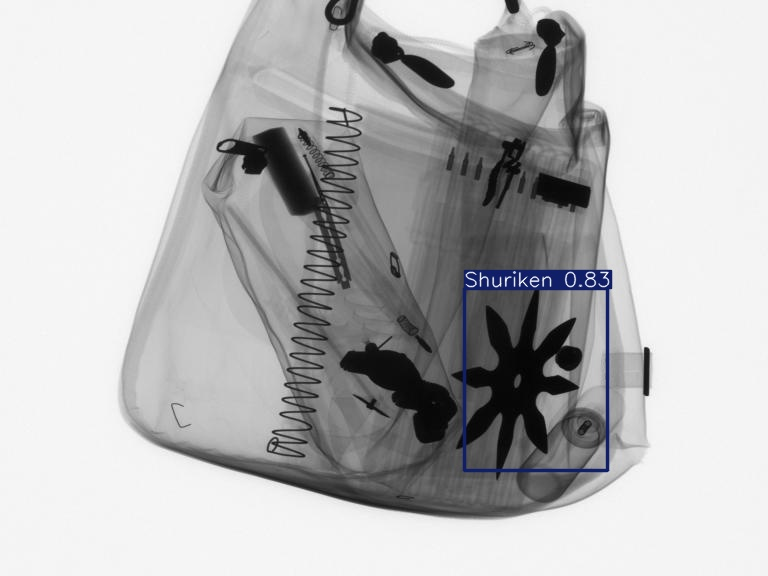

In [ ]:
import glob
from IPython.display import display, Image
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:30]:
    display(Image(filename=image_path, height=600))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import shutil

# Define the local path and Google Drive path
local_model_path = '/content/runs/detect/train/weights/best.pt'
google_drive_path = '/content/drive/My Drive/weaponFinal/best.pt'

# Ensure the destination directory exists, create if necessary
destination_directory = '/content/drive/My Drive/weaponFinal'
os.makedirs(destination_directory, exist_ok=True)

# Copy the file from local path to Google Drive
shutil.copy(local_model_path, google_drive_path)



'/content/drive/My Drive/weaponFinal/best.pt'

# YOLOV9

In [ ]:
!yolo task=detect mode=train model=yolov9s.pt data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml epochs=30 imgsz=640

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.pt, data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

# VISUALIZATIONS OF YOLOV9

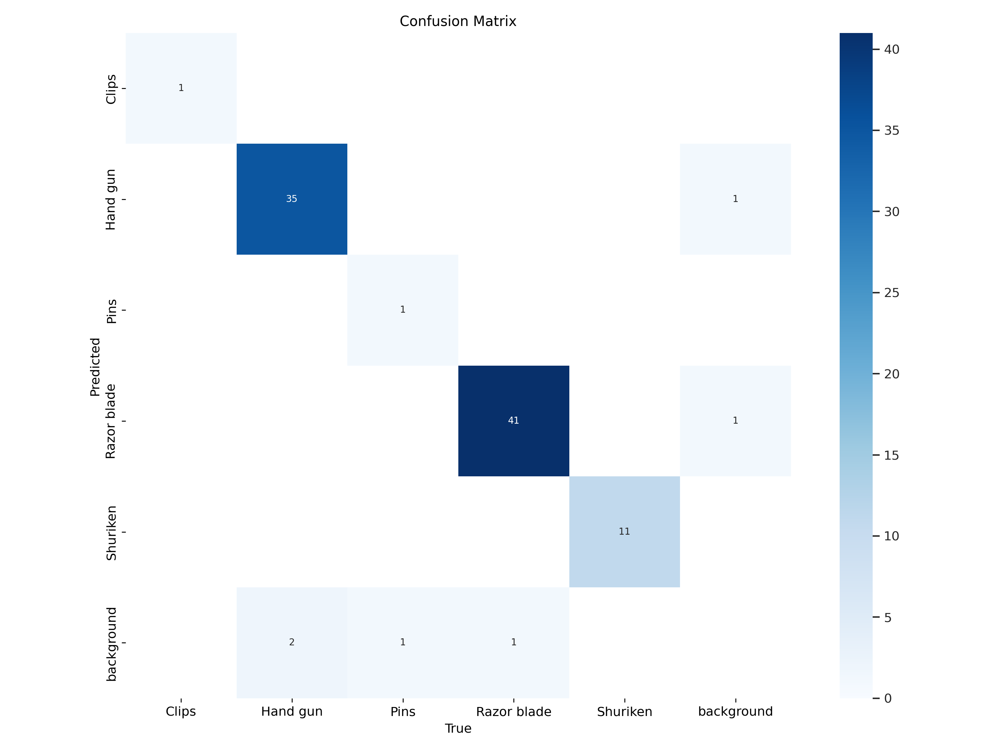

In [ ]:
import os
from IPython.display import display, Image
from IPython import display
Image(filename=f'/content/runs/detect/train2/confusion_matrix.png',width=600)

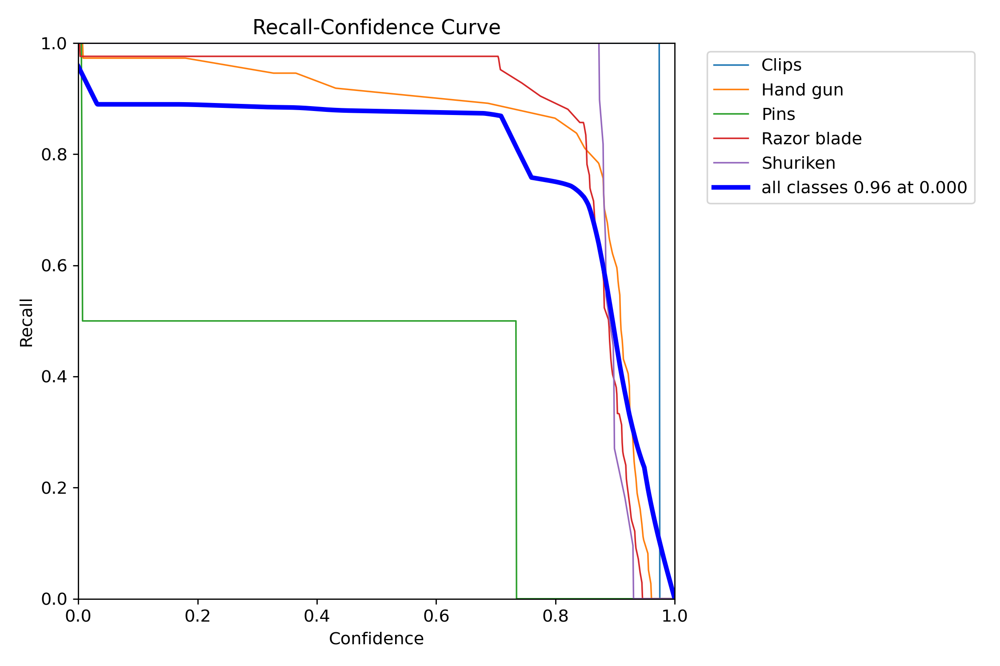

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved ROC curve image
roc_curve_path = '/content/runs/detect/train2/R_curve.png'

# Display the ROC curve image
display(Image(filename=roc_curve_path, width=600))


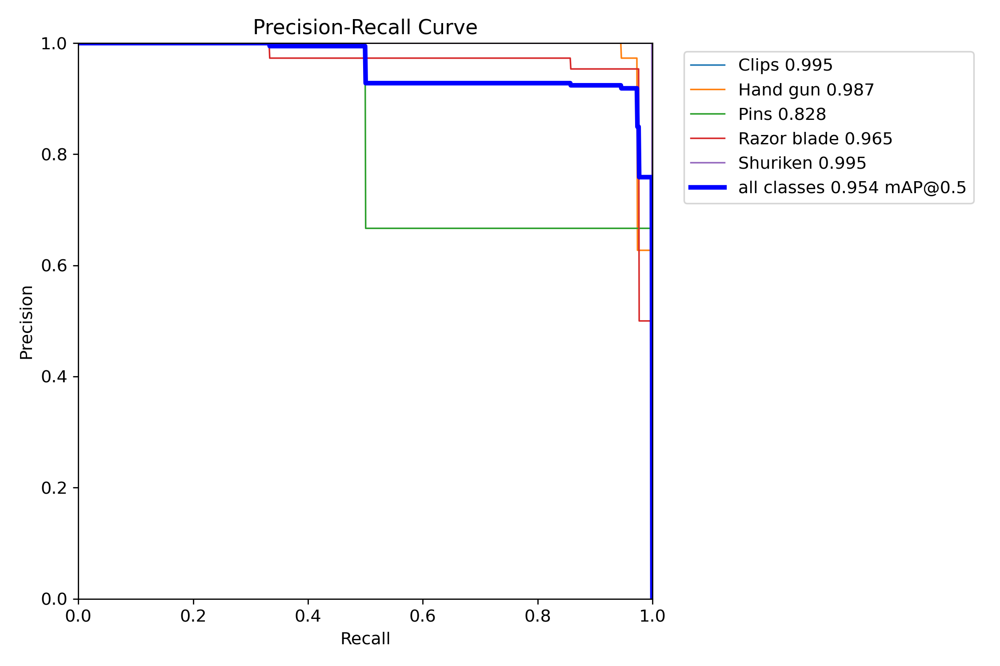

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved Precision-Recall curve image
pr_curve_path = '/content/runs/detect/train2/PR_curve.png'

# Display the Precision-Recall curve image
display(Image(filename=pr_curve_path, width=600))


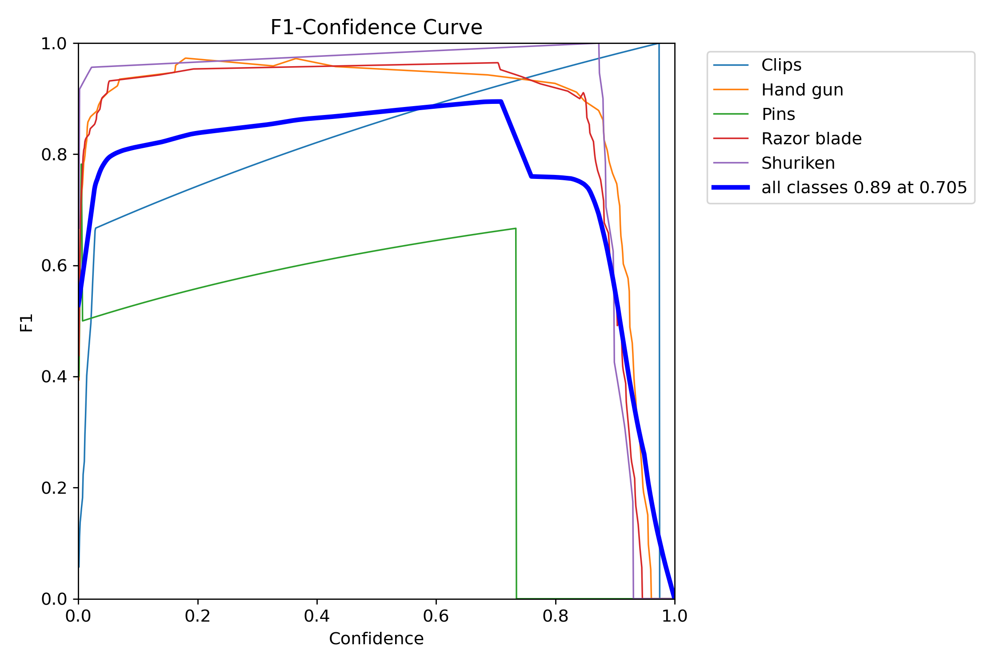

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved SHAP summary plot image
F1_curve_path = '/content/runs/detect/train2/F1_curve.png'

# Display the SHAP summary plot image
display(Image(filename=F1_curve_path, width=600))


In [ ]:
import shutil

# Define the local path and Google Drive path
local_model_path = '/content/runs/detect/train2/weights/best.pt'
google_drive_path = '/content/drive/My Drive/yolov9/best.pt'

# Ensure the destination directory exists, create if necessary
destination_directory = '/content/drive/My Drive/yolov9'
os.makedirs(destination_directory, exist_ok=True)

# Copy the file from local path to Google Drive
shutil.copy(local_model_path, google_drive_path)



'/content/drive/My Drive/yolov9/best.pt'

In [ ]:
!yolo task=detect mode=val model=/content/drive/MyDrive/yolov9/best.pt  data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9s summary (fused): 486 layers, 7,169,023 parameters, 0 gradients, 26.7 GFLOPs
val: Scanning /content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/valid/labels.cache... 93 images, 0 backgrounds, 0 corrupt: 100% 93/93 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 6/6 [00:03<00:00,  1.62it/s]
                   all         93         93      0.949      0.874      0.954      0.778
                 Clips          1          1      0.845          1      0.995      0.895
              Hand gun         37         37          1      0.893      0.987      0.846
                  Pins          2          2      0.965        0.5      0.828      0.512
           Razor blade         42         42      0.953      0.976      0.965      0.767
              Shuriken         11         11      0.981          1      0.995       0.87
Speed: 0.

In [ ]:
!yolo task=detect mode=predict model= /content/drive/MyDrive/yolov9/best.pt conf=0.25 source={dataset.location}/test/images

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9s summary (fused): 486 layers, 7,169,023 parameters, 0 gradients, 26.7 GFLOPs

image 1/42 /content/GDXrayDataSet2-1/test/images/108_PNG.rf.ab7ab79089766bb0887614e7e34db73b.jpg: 480x640 1 Hand gun, 90.3ms
image 2/42 /content/GDXrayDataSet2-1/test/images/112_PNG.rf.a5f873a39f4f98aa4d542f50a3ce4d2a.jpg: 480x640 1 Hand gun, 22.7ms
image 3/42 /content/GDXrayDataSet2-1/test/images/114_PNG.rf.ba7fa24ce421ae8b3411f5c140027b23.jpg: 480x640 1 Hand gun, 21.5ms
image 4/42 /content/GDXrayDataSet2-1/test/images/116_PNG.rf.8a6b715c163cb5e88c65baa2fd686e96.jpg: 480x640 1 Hand gun, 21.4ms
image 5/42 /content/GDXrayDataSet2-1/test/images/117_PNG.rf.a518ba322c420240bfa436f7c25680ea.jpg: 480x640 1 Hand gun, 29.5ms
image 6/42 /content/GDXrayDataSet2-1/test/images/150_PNG.rf.ffd8f8fc685dee1e0a138bb9ce37bc5b.jpg: 480x640 1 Hand gun, 23.6ms
image 7/42 /content/GDXrayDataSet2-1/test/images/155_PNG.rf.a803f062c9c496f5a6

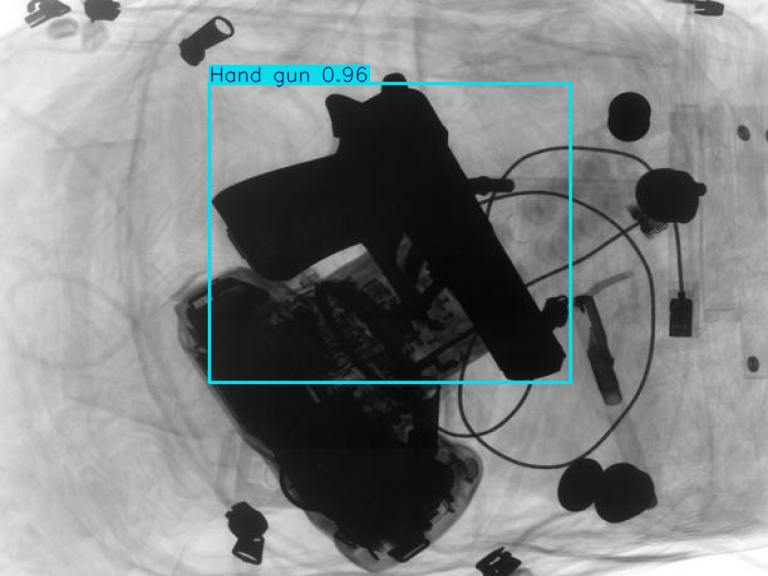

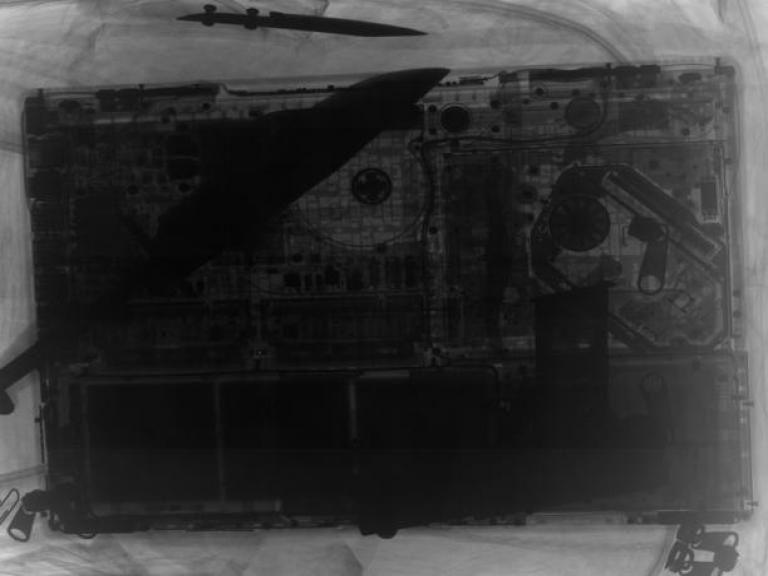

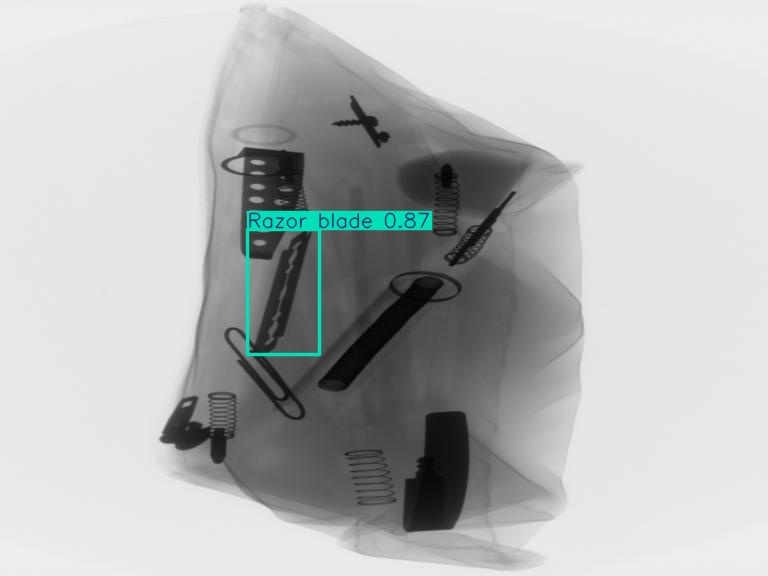

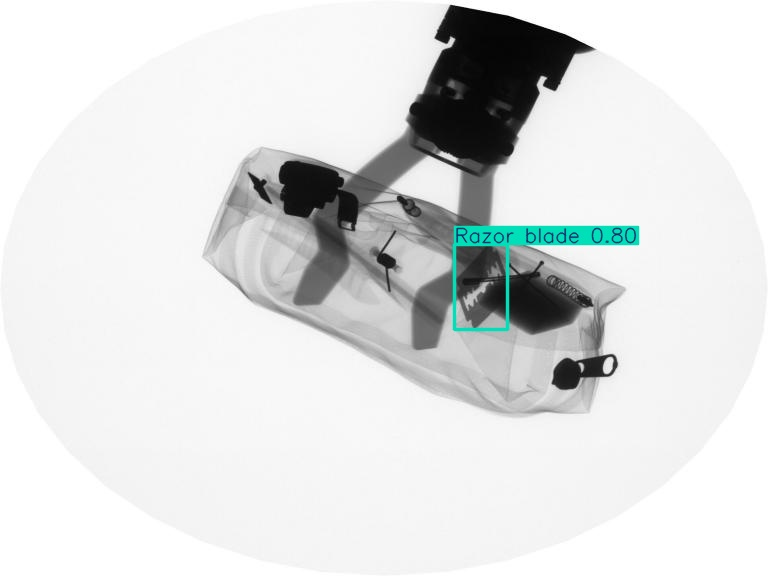

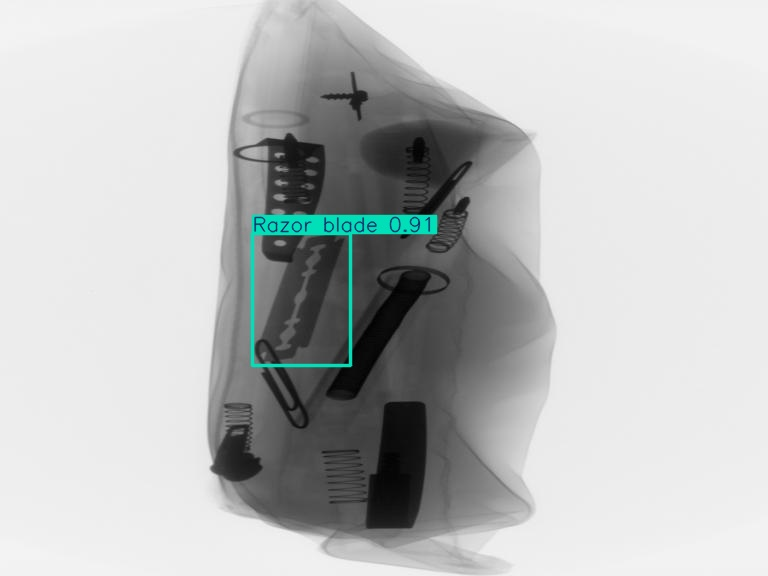

...

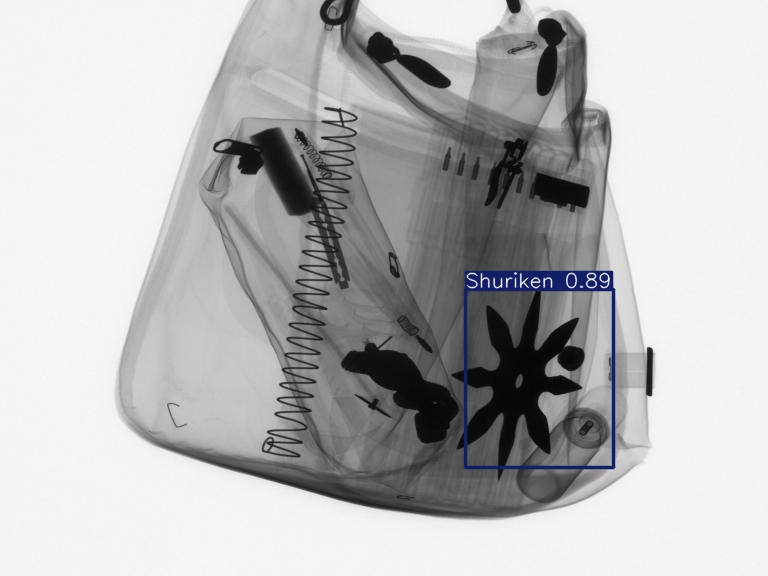

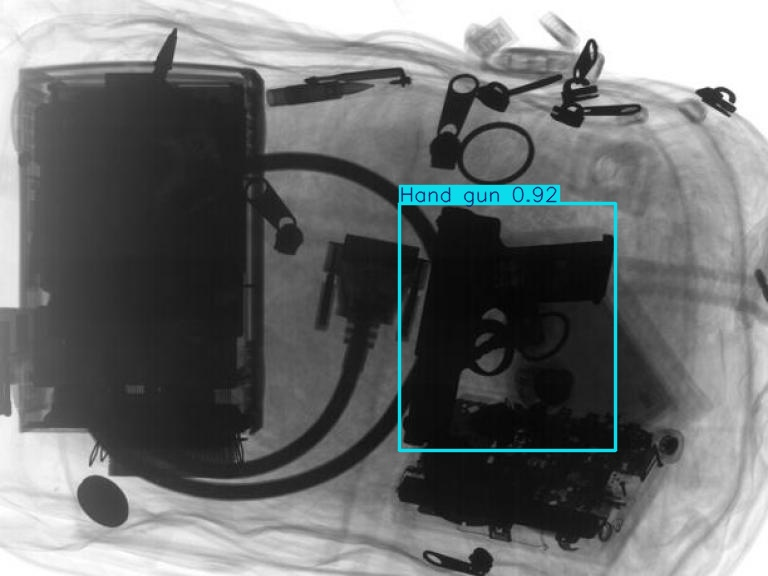

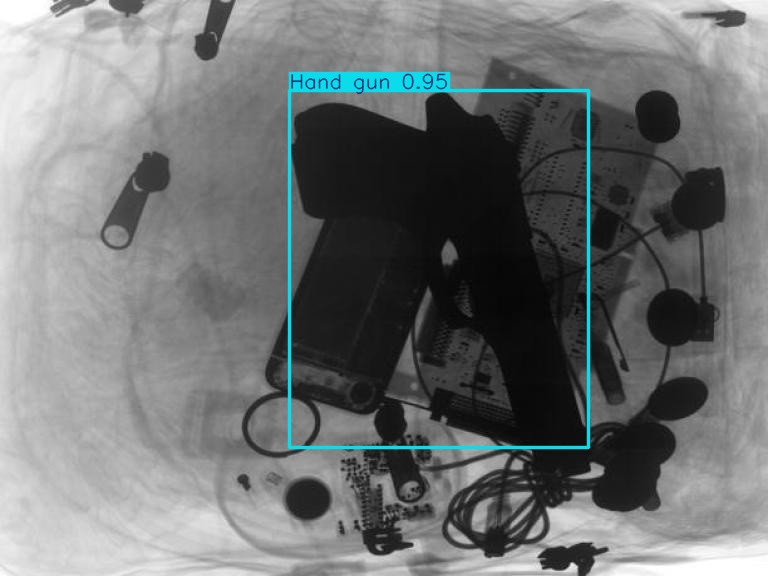

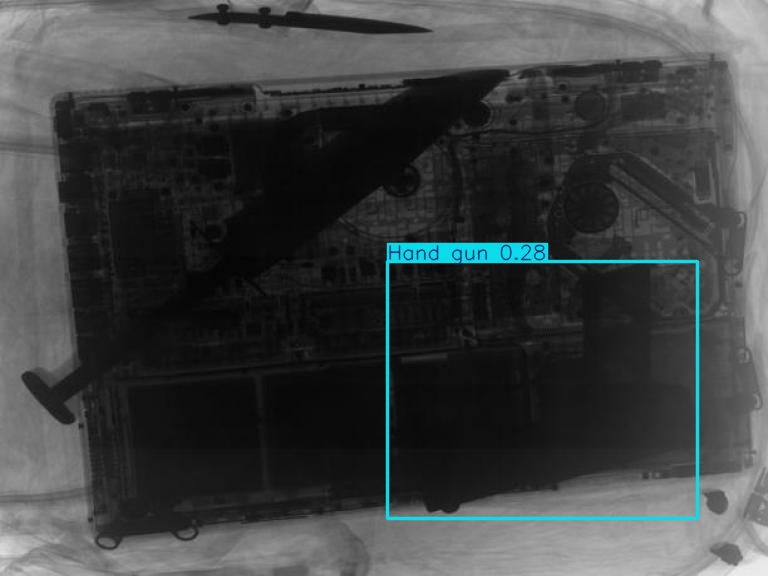

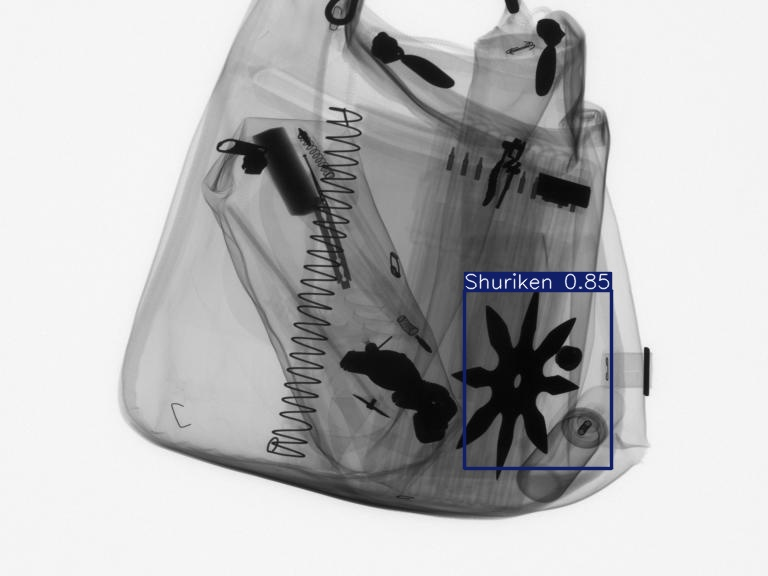

In [ ]:
import glob
from IPython.display import display, Image
for image_path in glob.glob(f'/content/runs/detect/predict2/*.jpg')[:30]:
    display(Image(filename=image_path, height=600))
    print("\n")

# YOLOV8

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml epochs=30 imgsz=640

100% 21.5M/21.5M [00:00<00:00, 221MB/s]
Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save

# VISUALIZATIONS OF YOLOV8

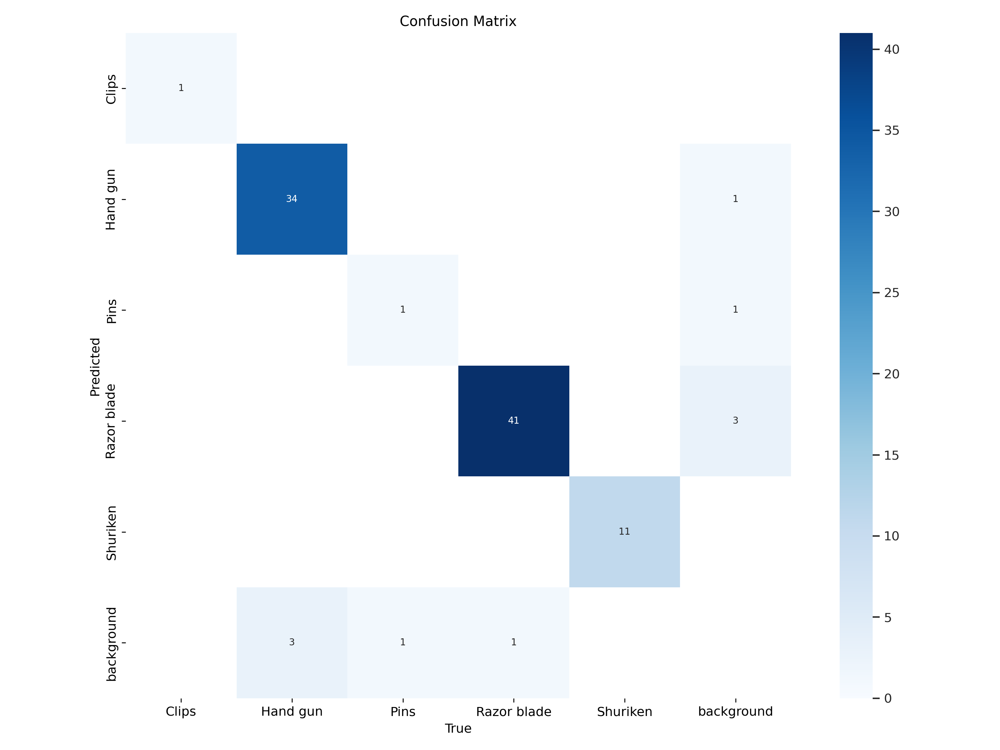

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved confusion matrix image
confusion_matrix_path = '/content/runs/detect/train3/confusion_matrix.png'

# Display the confusion matrix image
display(Image(filename=confusion_matrix_path, width=600))


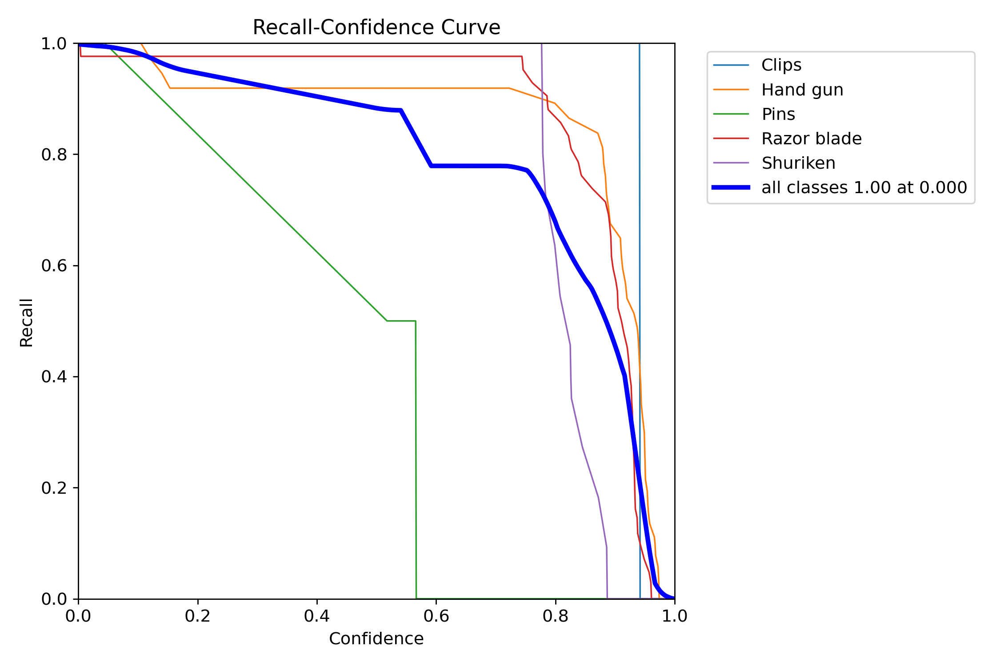

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved ROC curve image
roc_curve_path = '/content/runs/detect/train3/R_curve.png'

# Display the ROC curve image
display(Image(filename=roc_curve_path, width=600))


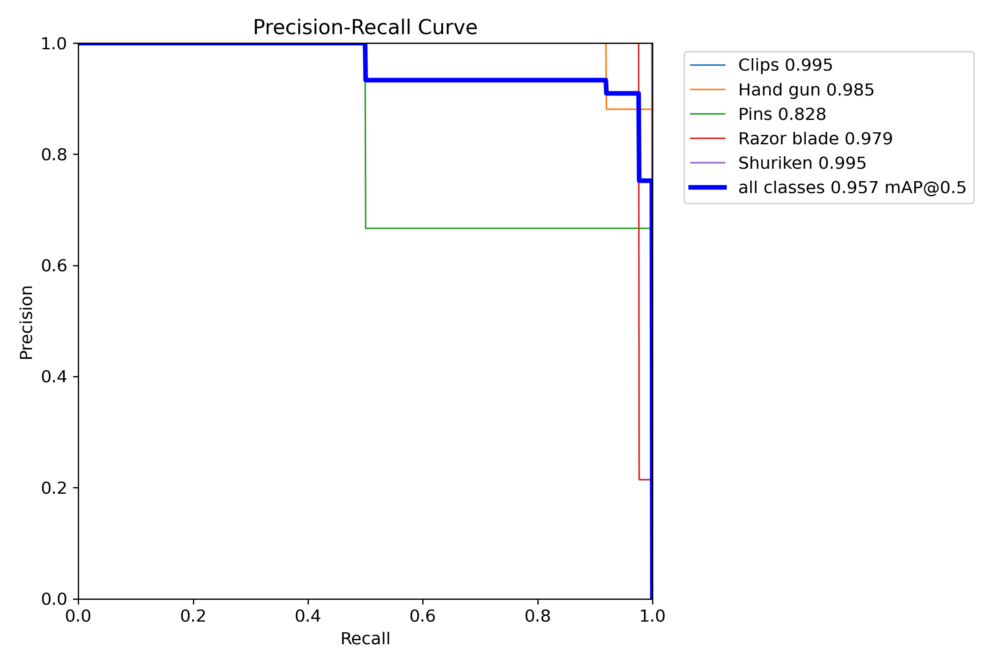

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved Precision-Recall curve image
pr_curve_path = '/content/runs/detect/train3/PR_curve.png'

# Display the Precision-Recall curve image
display(Image(filename=pr_curve_path, width=600))


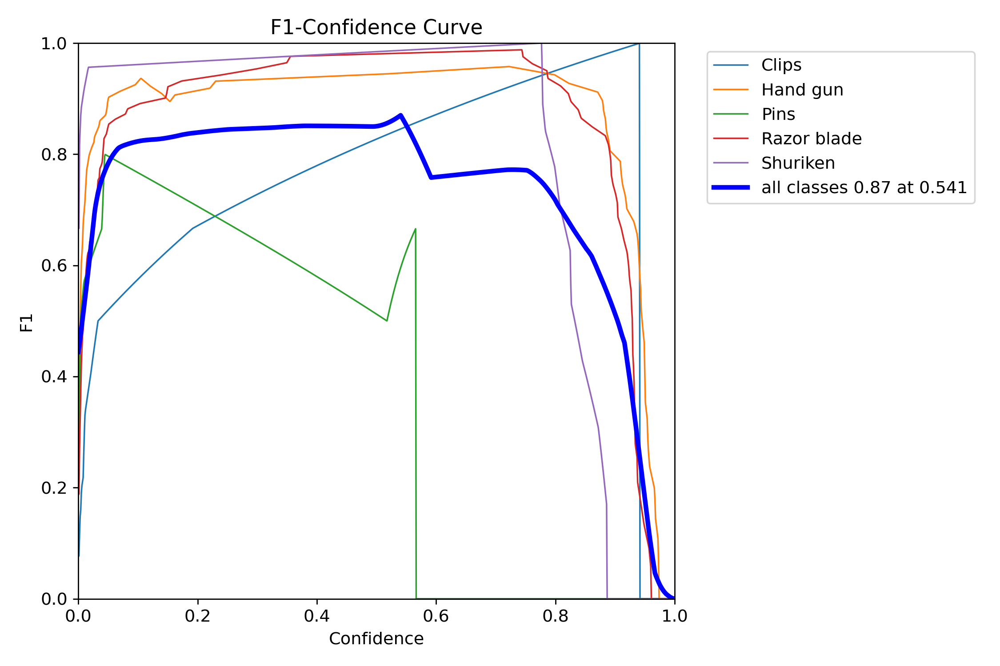

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved SHAP summary plot image
F1_curve_path = '/content/runs/detect/train3/F1_curve.png'

# Display the SHAP summary plot image
display(Image(filename=F1_curve_path, width=600))


In [ ]:
import shutil

# Define the local path and Google Drive path
local_model_path = '/content/runs/detect/train3/weights/best.pt'
google_drive_path = '/content/drive/My Drive/yolov8/best.pt'

# Ensure the destination directory exists, create if necessary
destination_directory = '/content/drive/My Drive/yolov8'
os.makedirs(destination_directory, exist_ok=True)

# Copy the file from local path to Google Drive
shutil.copy(local_model_path, google_drive_path)



'/content/drive/My Drive/yolov8/best.pt'

In [ ]:
!yolo task=detect mode=val model=/content/drive/MyDrive/yolov8/best.pt  data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/valid/labels.cache... 93 images, 0 backgrounds, 0 corrupt: 100% 93/93 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 6/6 [00:04<00:00,  1.32it/s]
                   all         93         93      0.829      0.879      0.957      0.791
                 Clips          1          1      0.715          1      0.995      0.895
              Hand gun         37         37      0.971      0.919      0.985      0.833
                  Pins          2          2      0.501      0.502      0.828      0.619
           Razor blade         42         42      0.986      0.976      0.979      0.777
              Shuriken         11         11      0.971          1      0.995      0.833
Speed: 3.4

In [ ]:
!yolo task=detect mode=predict model= /content/drive/MyDrive/yolov8/best.pt conf=0.25 source={dataset.location}/test/images

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs

image 1/42 /content/GDXrayDataSet2-1/test/images/108_PNG.rf.ab7ab79089766bb0887614e7e34db73b.jpg: 480x640 1 Hand gun, 72.1ms
image 2/42 /content/GDXrayDataSet2-1/test/images/112_PNG.rf.a5f873a39f4f98aa4d542f50a3ce4d2a.jpg: 480x640 2 Hand guns, 13.0ms
image 3/42 /content/GDXrayDataSet2-1/test/images/114_PNG.rf.ba7fa24ce421ae8b3411f5c140027b23.jpg: 480x640 2 Hand guns, 12.9ms
image 4/42 /content/GDXrayDataSet2-1/test/images/116_PNG.rf.8a6b715c163cb5e88c65baa2fd686e96.jpg: 480x640 1 Hand gun, 13.0ms
image 5/42 /content/GDXrayDataSet2-1/test/images/117_PNG.rf.a518ba322c420240bfa436f7c25680ea.jpg: 480x640 1 Hand gun, 12.9ms
image 6/42 /content/GDXrayDataSet2-1/test/images/150_PNG.rf.ffd8f8fc685dee1e0a138bb9ce37bc5b.jpg: 480x640 1 Hand gun, 12.9ms
image 7/42 /content/GDXrayDataSet2-1/test/images/155_PNG.rf.a803f062c9c496f5a

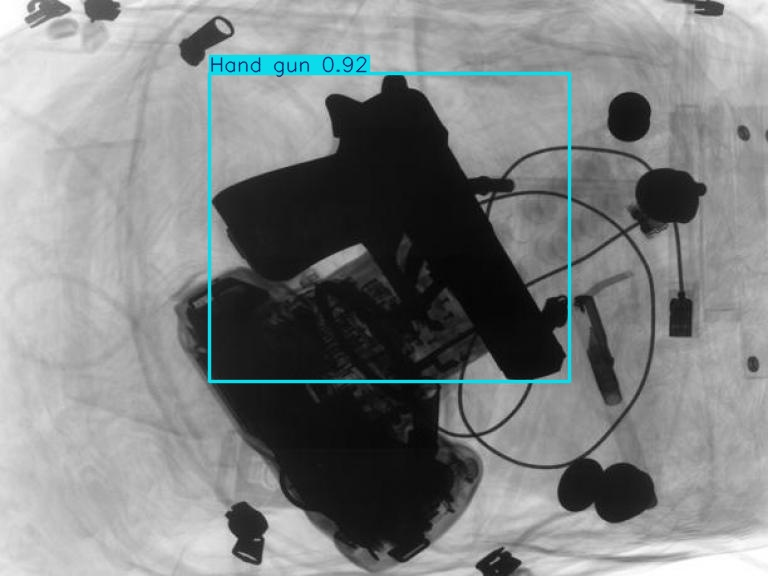

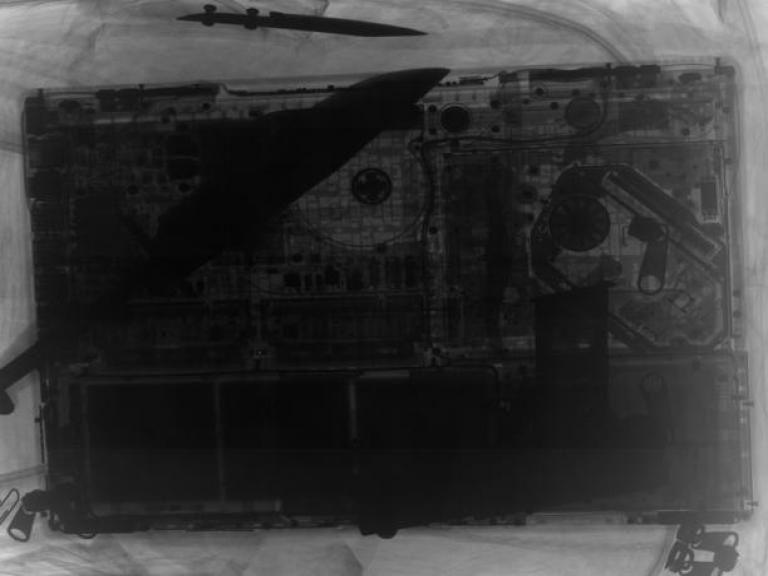

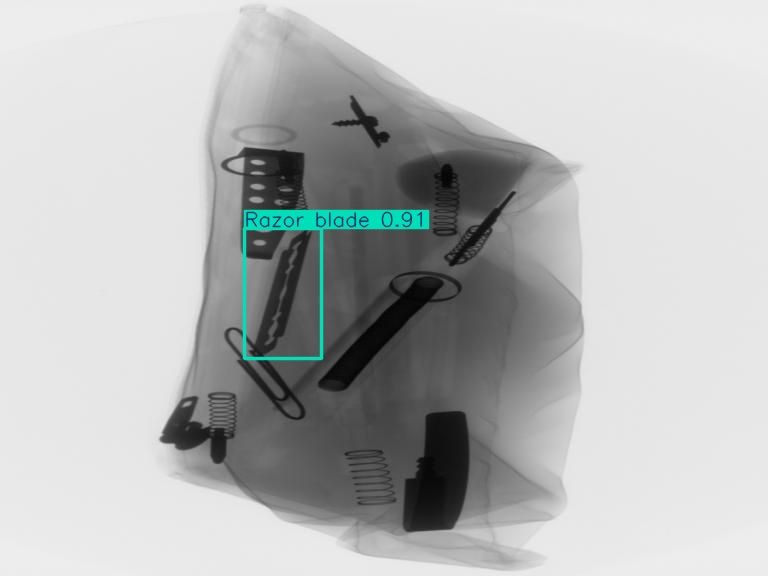

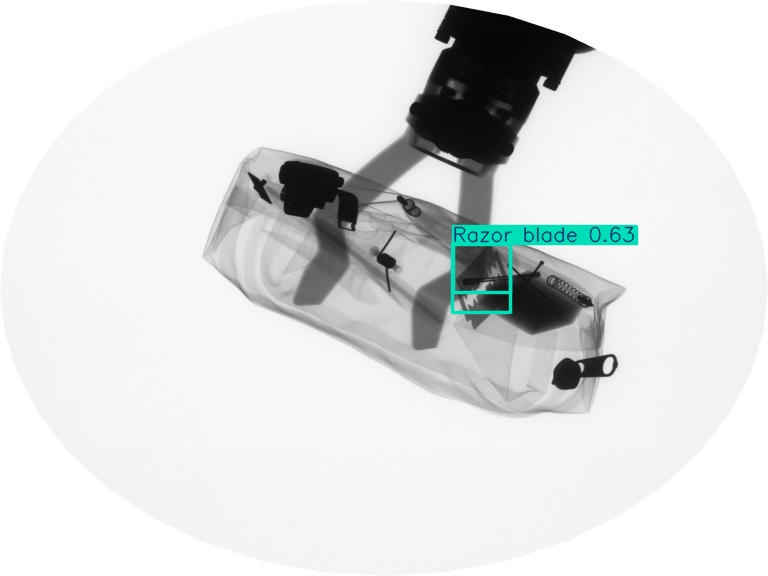

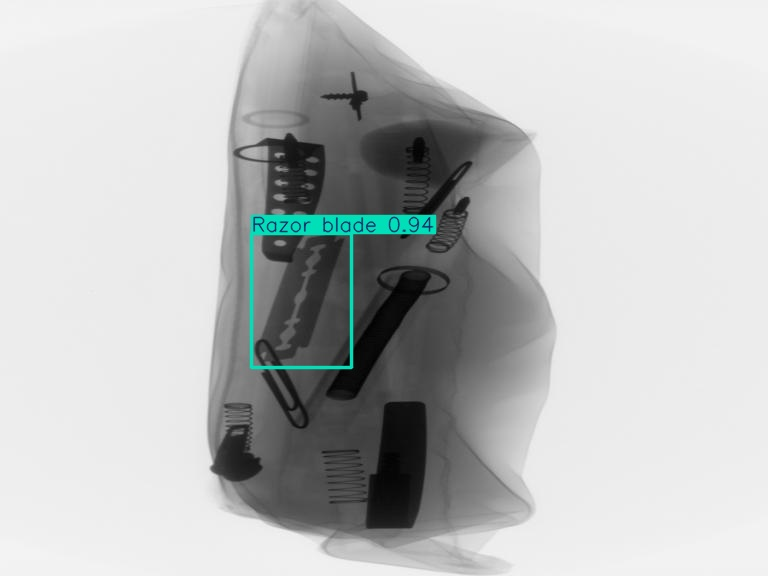

...

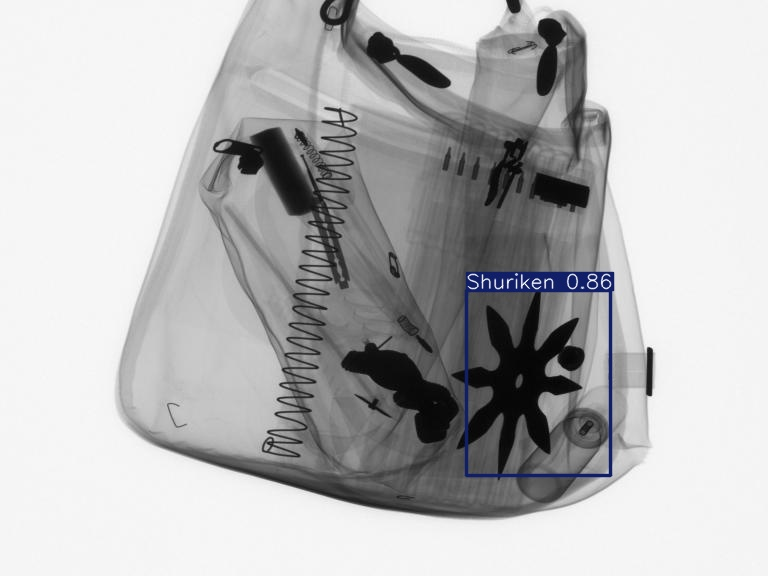

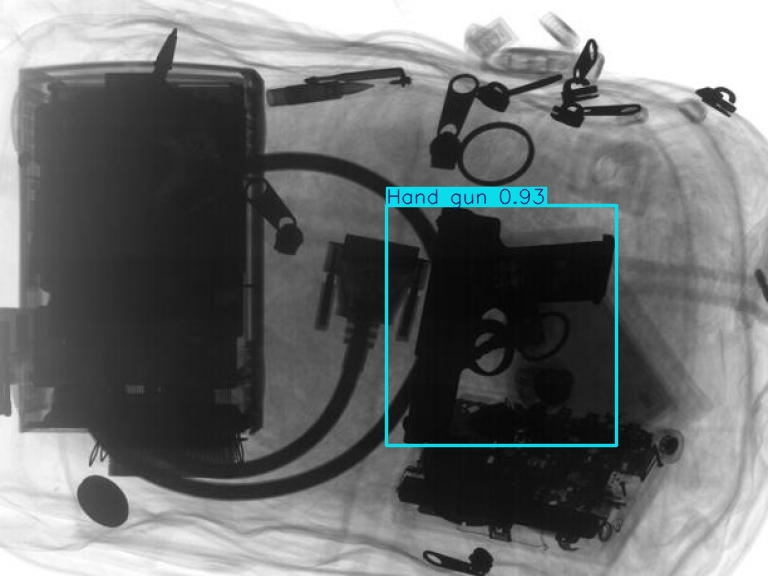

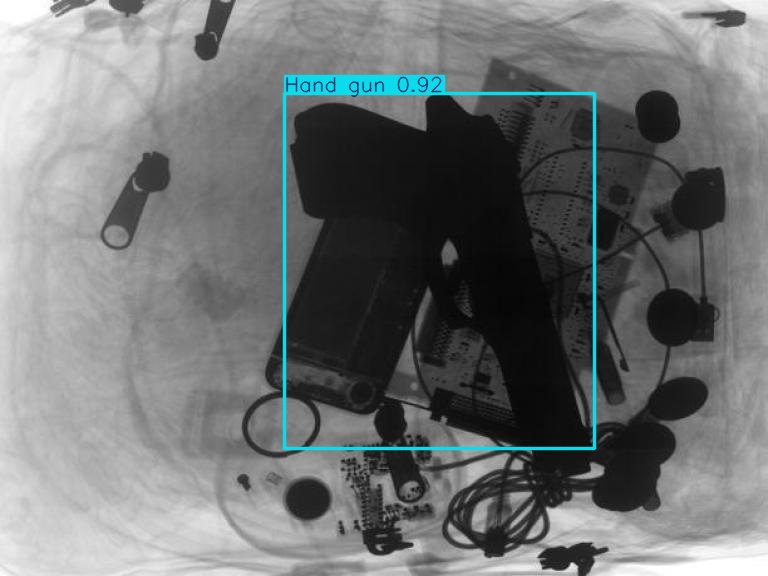

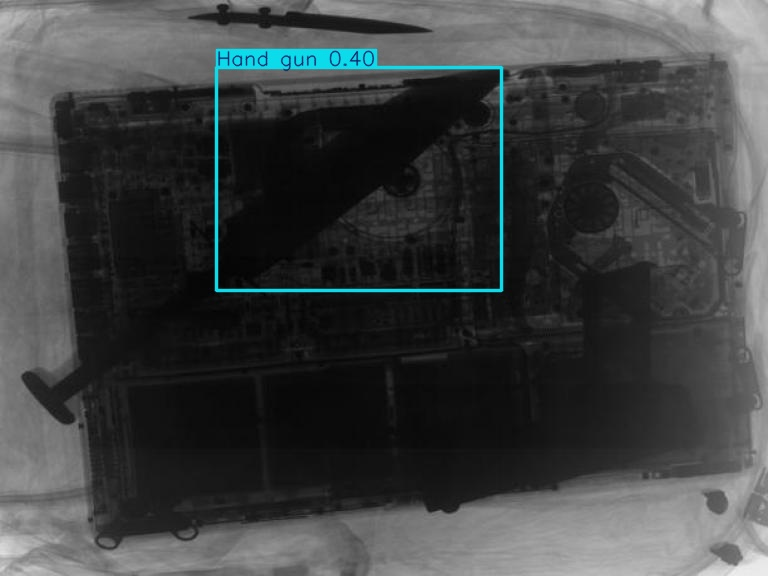

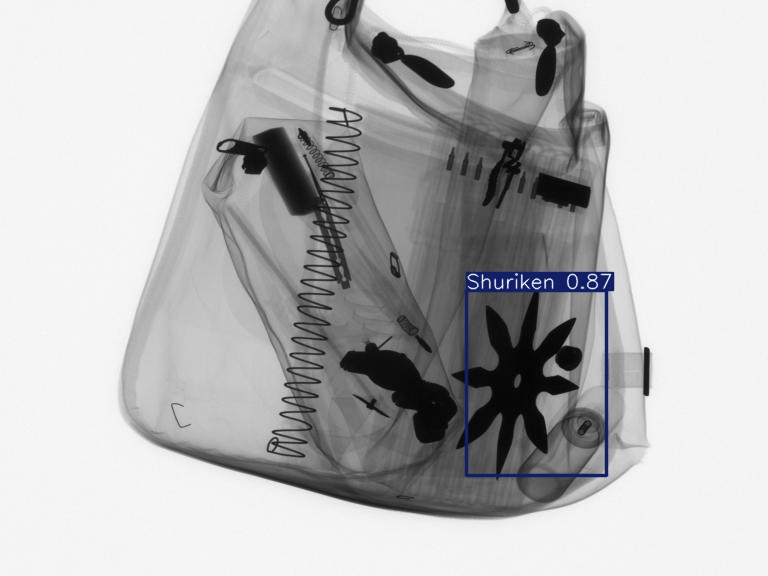

In [ ]:
import glob
from IPython.display import display, Image
for image_path in glob.glob(f'/content/runs/detect/predict3/*.jpg')[:30]:
    display(Image(filename=image_path, height=600))
    print("\n")

# YOLOV5

In [ ]:
!yolo task=detect mode=train model=yolov5s.pt data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml epochs=30 imgsz=640

PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

100% 17.7M/17.7M [00:00<00:00, 133MB/s] 
Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybri

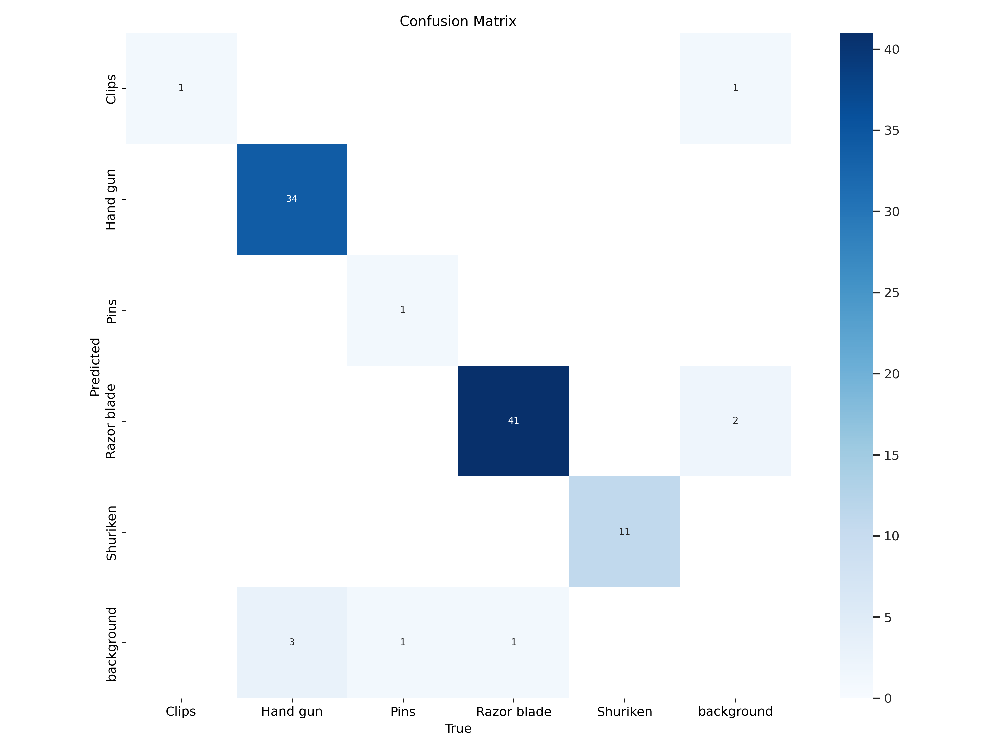

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved confusion matrix image
confusion_matrix_path = '/content/runs/detect/train4/confusion_matrix.png'

# Display the confusion matrix image
display(Image(filename=confusion_matrix_path, width=600))


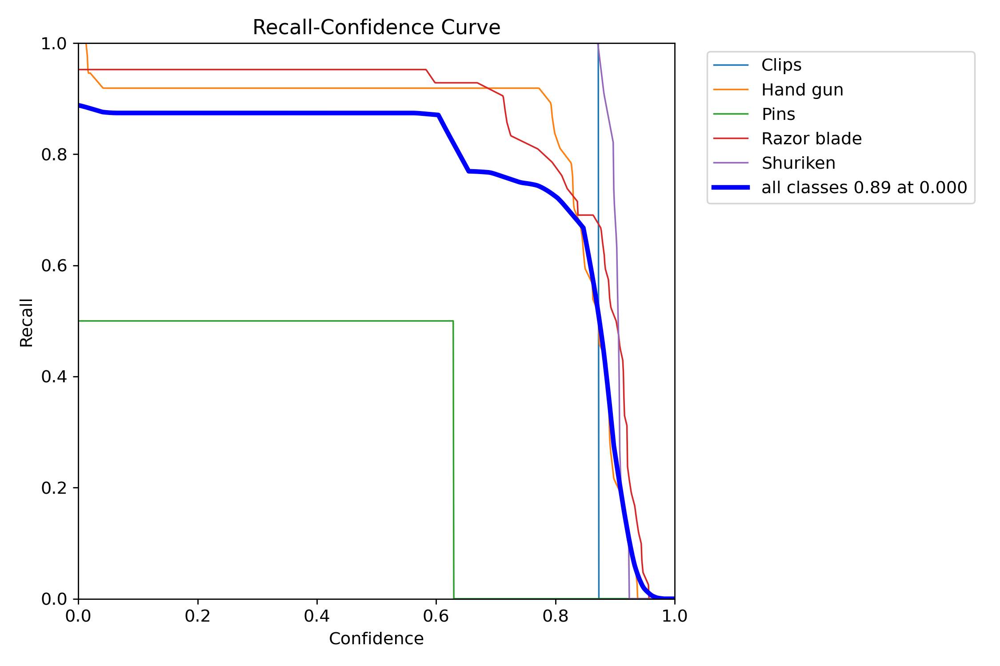

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved ROC curve image
roc_curve_path = '/content/runs/detect/train4/R_curve.png'

# Display the ROC curve image
display(Image(filename=roc_curve_path, width=600))


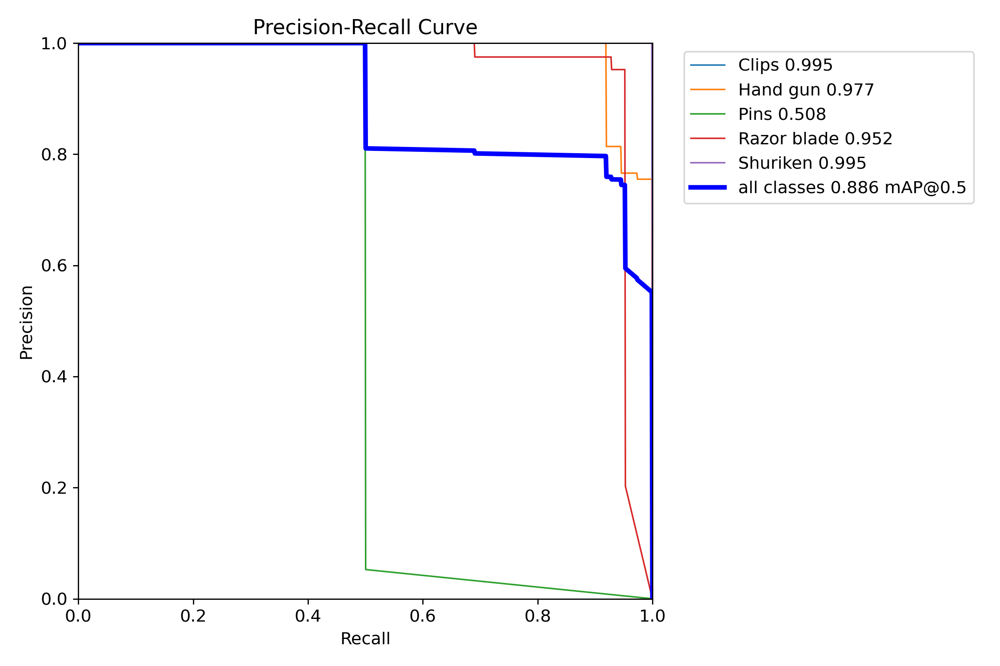

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved Precision-Recall curve image
pr_curve_path = '/content/runs/detect/train4/PR_curve.png'

# Display the Precision-Recall curve image
display(Image(filename=pr_curve_path, width=600))


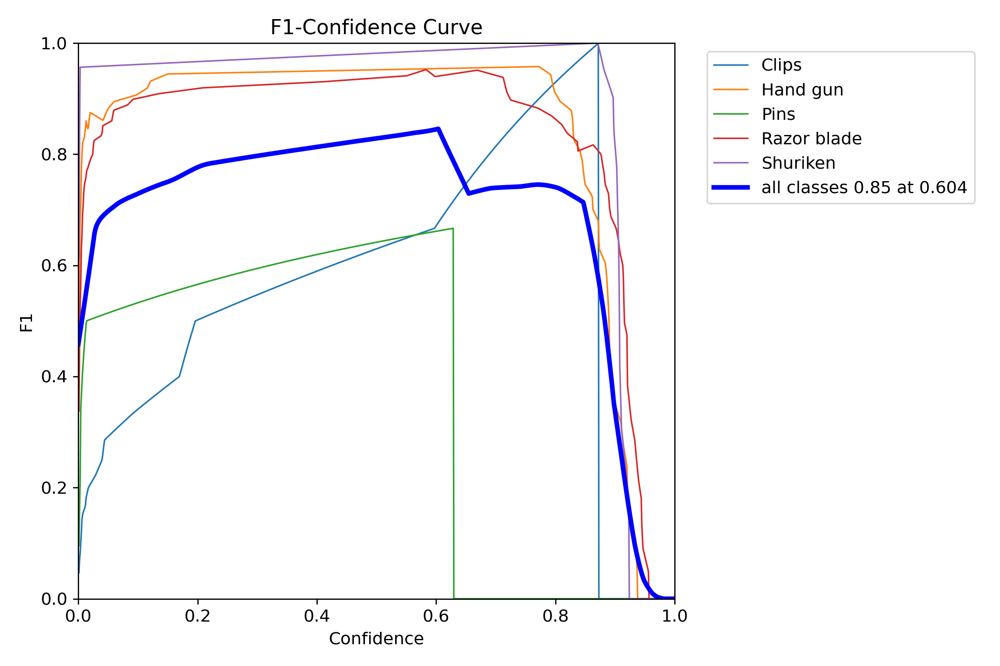

In [ ]:
import os
from IPython.display import Image, display

# Path to your saved SHAP summary plot image
F1_curve_path = '/content/runs/detect/train4/F1_curve.png'

# Display the SHAP summary plot image
display(Image(filename=F1_curve_path, width=600))


In [ ]:
import shutil

# Define the local path and Google Drive path
local_model_path = '/content/runs/detect/train4/weights/best.pt'
google_drive_path = '/content/drive/My Drive/yolov5/best.pt'

# Ensure the destination directory exists, create if necessary
destination_directory = '/content/drive/My Drive/yolov5'
os.makedirs(destination_directory, exist_ok=True)

# Copy the file from local path to Google Drive
shutil.copy(local_model_path, google_drive_path)



'/content/drive/My Drive/yolov5/best.pt'

In [ ]:
!yolo task=detect mode=val model=/content/drive/MyDrive/yolov5/best.pt  data=/content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/data.yaml

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5s summary (fused): 193 layers, 9,113,471 parameters, 0 gradients, 23.8 GFLOPs
val: Scanning /content/drive/MyDrive/weaponFinal/GDXrayDataSet2.v1i.yolov9/valid/labels.cache... 93 images, 0 backgrounds, 0 corrupt: 100% 93/93 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 6/6 [00:05<00:00,  1.14it/s]
                   all         93         93      0.873      0.874      0.886      0.732
                 Clips          1          1      0.492          1      0.995      0.895
              Hand gun         37         37      0.991      0.919      0.977      0.835
                  Pins          2          2      0.959        0.5      0.508      0.356
           Razor blade         42         42      0.949      0.952      0.952      0.756
              Shuriken         11         11      0.972          1      0.995      0.817
Speed: 10

In [ ]:
!yolo task=detect mode=predict model= /content/drive/MyDrive/yolov5/best.pt conf=0.25 source={dataset.location}/test/images

Ultralytics YOLOv8.2.75 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5s summary (fused): 193 layers, 9,113,471 parameters, 0 gradients, 23.8 GFLOPs

image 1/42 /content/GDXrayDataSet2-1/test/images/108_PNG.rf.ab7ab79089766bb0887614e7e34db73b.jpg: 480x640 1 Hand gun, 71.3ms
image 2/42 /content/GDXrayDataSet2-1/test/images/112_PNG.rf.a5f873a39f4f98aa4d542f50a3ce4d2a.jpg: 480x640 1 Hand gun, 11.8ms
image 3/42 /content/GDXrayDataSet2-1/test/images/114_PNG.rf.ba7fa24ce421ae8b3411f5c140027b23.jpg: 480x640 1 Hand gun, 11.8ms
image 4/42 /content/GDXrayDataSet2-1/test/images/116_PNG.rf.8a6b715c163cb5e88c65baa2fd686e96.jpg: 480x640 1 Hand gun, 11.7ms
image 5/42 /content/GDXrayDataSet2-1/test/images/117_PNG.rf.a518ba322c420240bfa436f7c25680ea.jpg: 480x640 1 Hand gun, 11.7ms
image 6/42 /content/GDXrayDataSet2-1/test/images/150_PNG.rf.ffd8f8fc685dee1e0a138bb9ce37bc5b.jpg: 480x640 1 Hand gun, 11.7ms
image 7/42 /content/GDXrayDataSet2-1/test/images/155_PNG.rf.a803f062c9c496f5a6

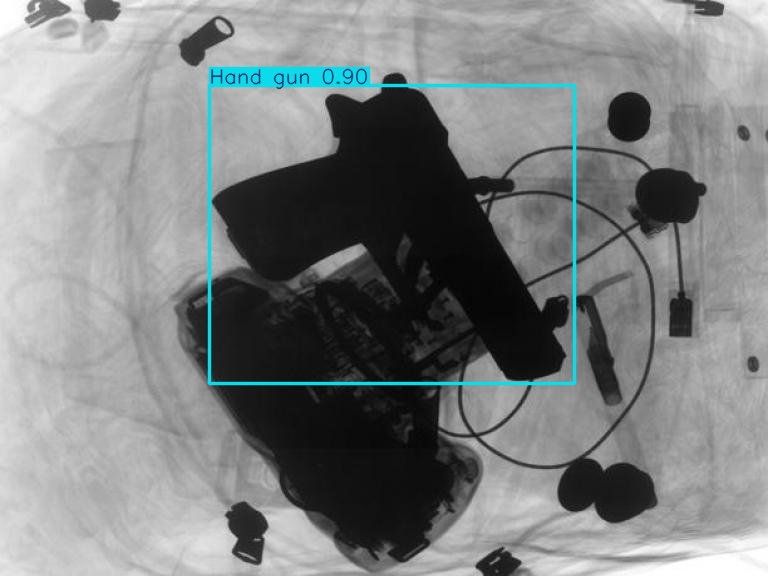

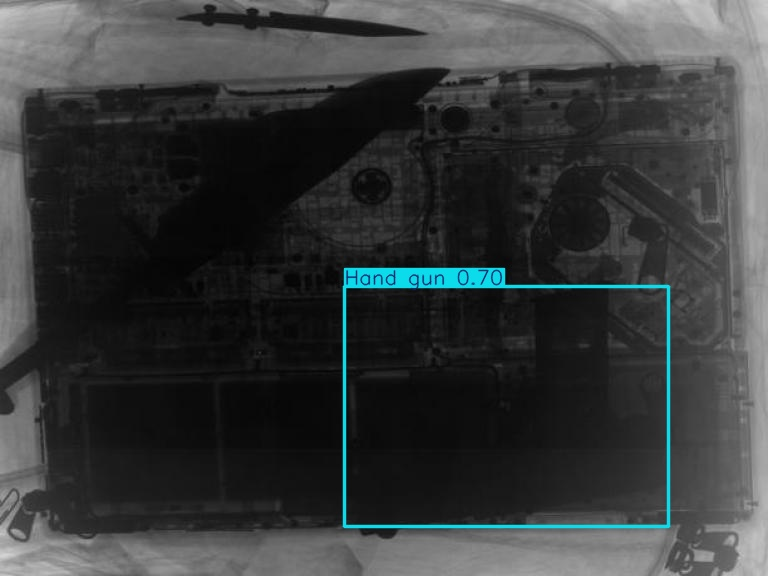

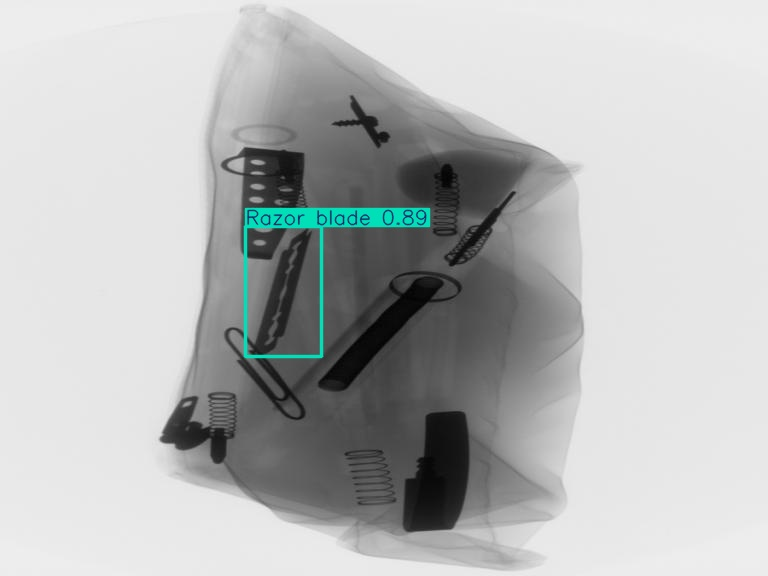

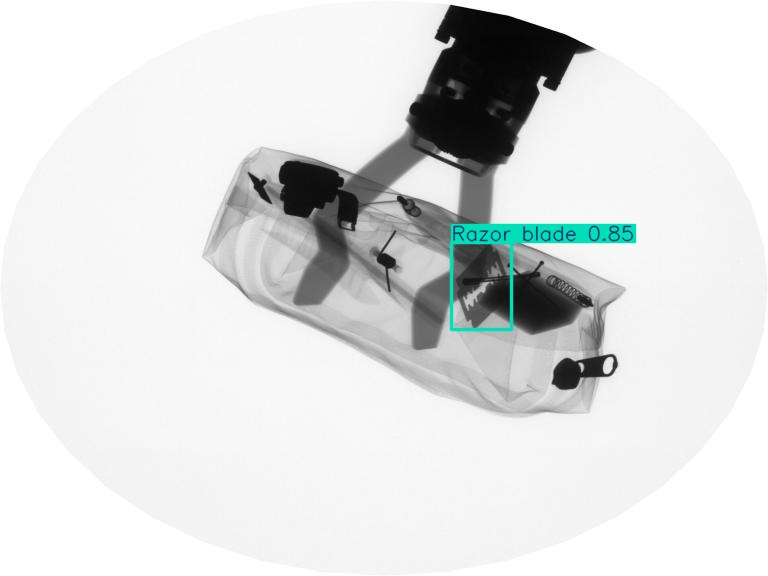

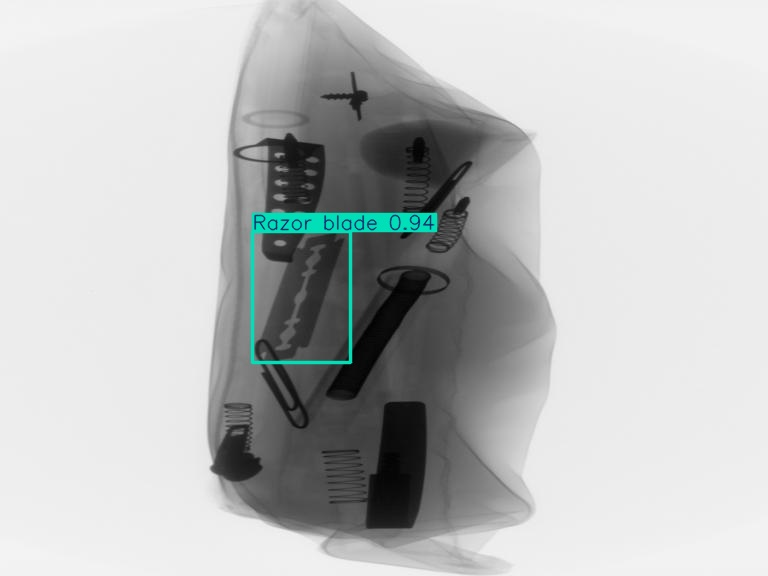

...

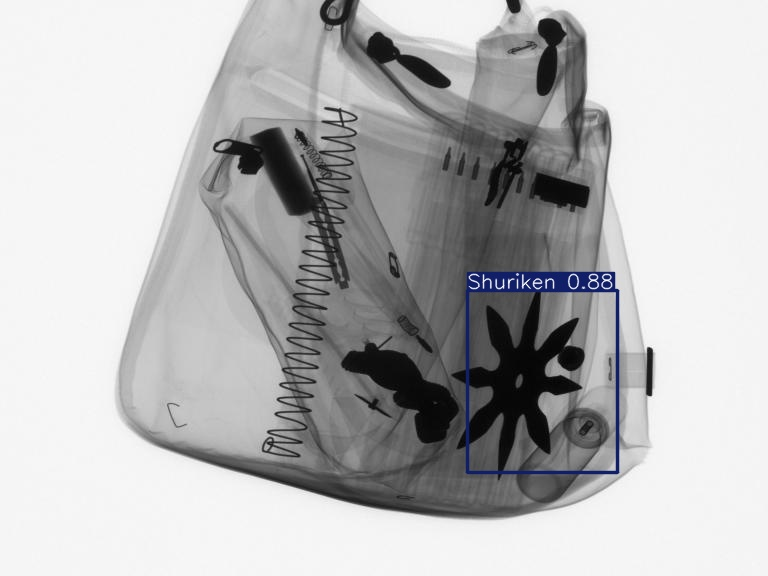

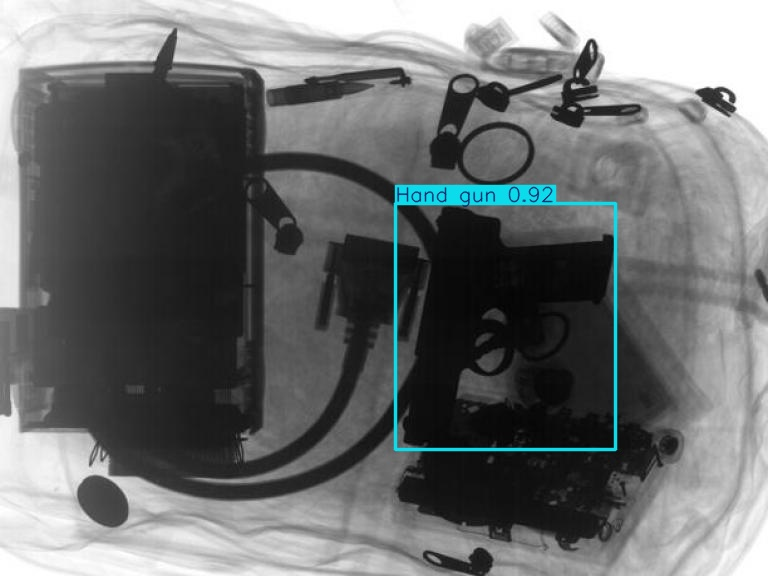

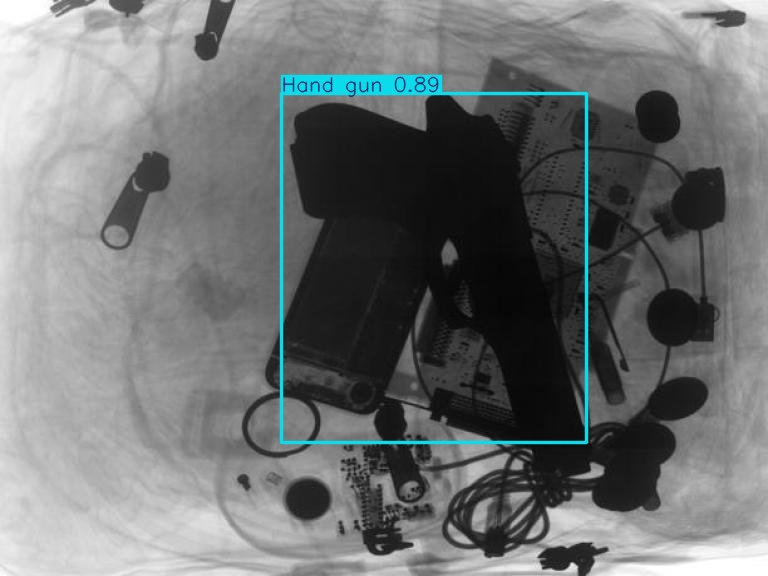

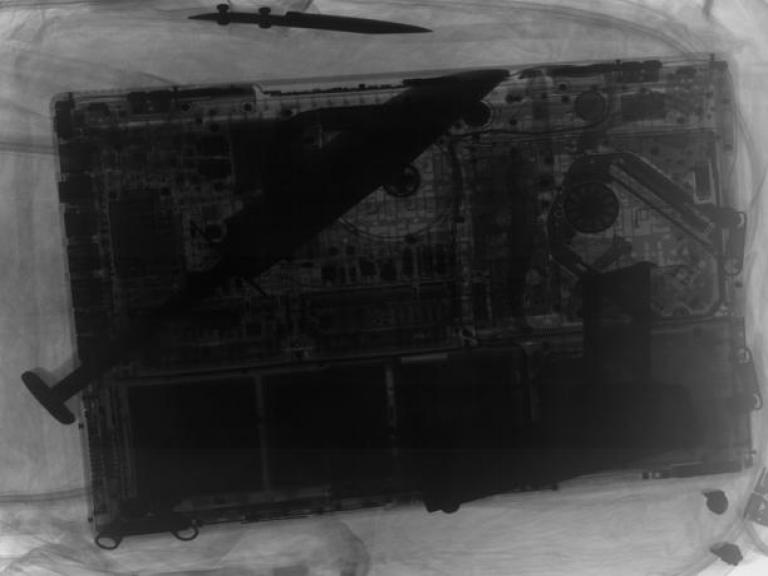

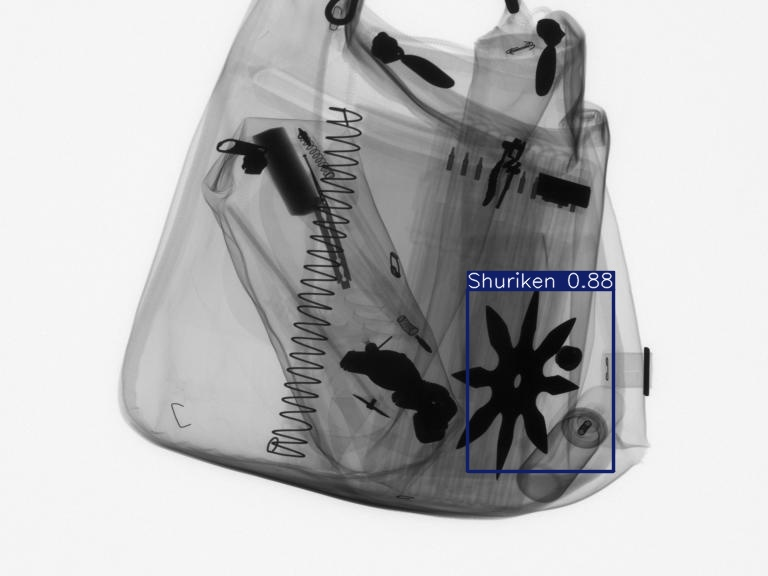

In [ ]:
import glob
from IPython.display import display, Image
for image_path in glob.glob(f'/content/runs/detect/predict4/*.jpg')[:30]:
    display(Image(filename=image_path, height=600))
    print("\n")

# Creating a streamlit app

In [1]:
!pip install streamlit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 63.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.9/82.9 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.5 MB/s eta 0:00:00
  Attempting uninstall: tenacity
    Found existing installation: tenacity 9.0.0
    Uninstalling tenacity-9.0.0:
      Successfully uninstalled tenacity-9.0.0


In [ ]:
!wget -q -O - ipv4.icanhazip.com

34.124.186.28


In [3]:
!streamlit run app.py &> /dev/null &

In [4]:
! pip install pyngrok

In [5]:
! ngrok config add-authtoken 2kW9ISC295IKeLCVmyYI4UvQ9e0_4jDKyiz4WWTP8q4MJJJzG

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [6]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip

--2024-08-12 05:16:53--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 54.161.241.46, 54.237.133.81, 18.205.222.128, ...
Connecting to bin.equinox.io (bin.equinox.io)|54.161.241.46|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13921656 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]  13.28M  17.8MB/s    in 0.7s    

2024-08-12 05:16:54 (17.8 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [13921656/13921656]



In [7]:
!unzip ngrok-stable-linux-amd64.zip


Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   


In [8]:
get_ipython().system_raw('./ngrok http 8501 &')

In [9]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/usr/lib/python3.10/json/__init__.py", line 293, in load
    return loads(fp.read(),
  File "/usr/lib/python3.10/json/__init__.py", line 346, in loads
    return _default_decoder.decode(s)
  File "/usr/lib/python3.10/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/usr/lib/python3.10/json/decoder.py", line 355, in raw_decode
    raise JSONDecodeError("Expecting value", s, err.value) from None
json.decoder.JSONDecodeError: Expecting value: line 1 column 1 (char 0)


In [21]:
!pip install pyngrok streamlit

from pyngrok import ngrok
import os

# Start ngrok and get the public URL
# Removed 'region' parameter as it's not supported for 'http' protocol
public_url = ngrok.connect(8501, proto='http')
print("ngrok public URL:", public_url)

# Run the Streamlit app
os.system('streamlit run app.py')

ngrok public URL: NgrokTunnel: "https://1d85-34-168-252-170.ngrok-free.app" -> "http://localhost:8501"


2

['GDXrayDataSet2.v1i.yolov9', 'yolov10_best.pt']

In [11]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.